# End-to-end Multil-class Dog Breed Classification
This notebook builds an end-to-end multi-class image classifier using TensorFlow 2 and TensorFlow Hub.

# 1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

# 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

# 3. Evaluation
The evaluation is Multi Class Log Loss between the predicted probability and the observed target.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

# 4. Features
Some information about the data:

- We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
- There are 120 breeds of dogs (this means there are 120 different classes).
- There are around 10,000+ images in the training set (these images have labels).
- There are around 10,000+ images in the test set (these images have no labels, because we want to predict them).

# Get our workspace ready

In [5]:
# Import tensorflow
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF_hub version: ", hub.__version__)

# Check GPU availability
print("GPU", "is available" if tf.config.list_physical_devices('GPU') else "not available")

TF version:  2.15.0
TF_hub version:  0.15.0
GPU is available


# Getting data ready (into Tensors)

In [6]:
import matplotlib.pyplot as plt
import pandas as pd
import os

In [39]:
# Checkout labels of data
labels_csv = pd.read_csv("/content/drive/MyDrive/AI/Deep Learning: \"Learning\"/dog-breed-classification/labels.csv")

In [4]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [5]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

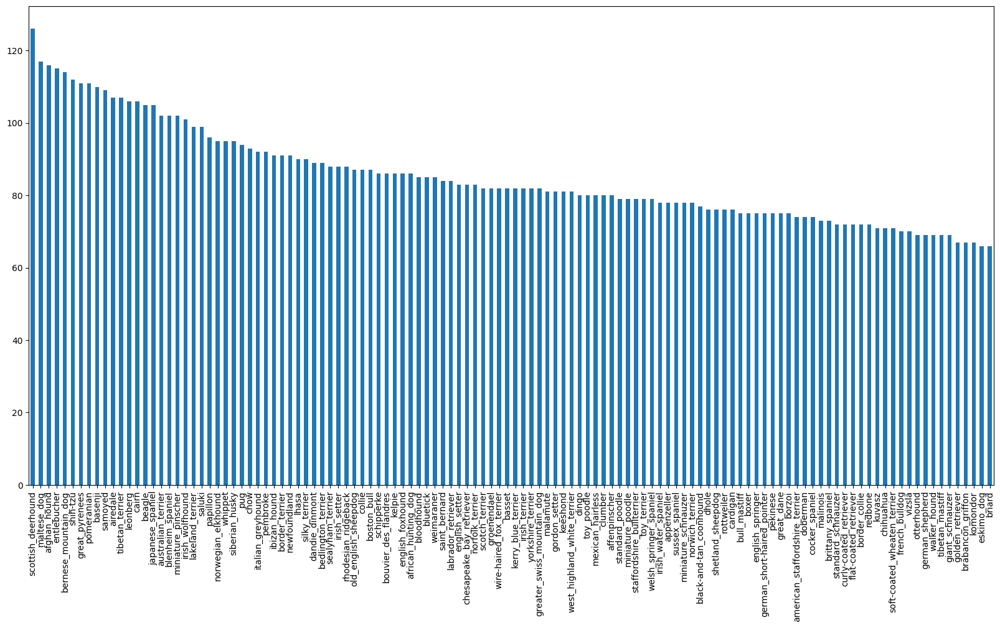

In [6]:
plt.figure(figsize=(20,10))
labels_csv.breed.value_counts().plot(kind='bar')

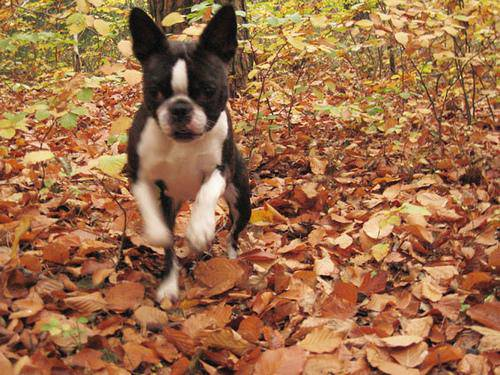

In [7]:
# View an image
from IPython.display import Image
Image("/content/drive/MyDrive/AI/Deep Learning: \"Learning\"/dog-breed-classification/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

# Getting images and labels

In [8]:
# Create pathnames from image ID's
train_filenames = [f"/content/drive/MyDrive/AI/Deep Learning: \"Learning\"/dog-breed-classification/train/{fname}.jpg" for fname in labels_csv['id']]
train_filenames[:10]

['/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/conte

In [9]:
import os
if len(os.listdir("/content/drive/MyDrive/AI/Deep Learning: \"Learning\"/dog-breed-classification/train/")) == len(train_filenames):
    print("Filenames match actual number of files.")
else:
    print("Filenames do not match actual number of files, check the target directory.")

Filenames match actual number of files.


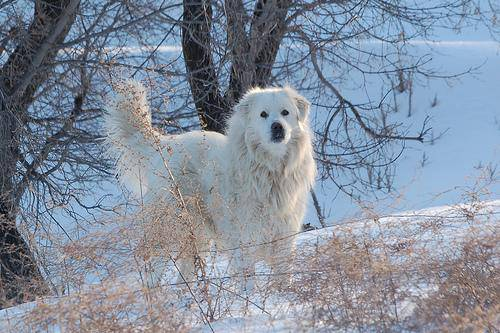

In [10]:
# Check
Image(train_filenames[6666])

In [11]:
labels_csv['breed'][6666]

'great_pyrenees'

In [40]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [13]:
len(labels)

10222

In [14]:
# See if number of labels matches the number of filenames
if len(labels) == len(train_filenames):
    print("Number of labels matches number of filenames.")
else:
    print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames.


In [41]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [16]:
len(unique_breeds)

120

In [17]:
# Turn labels into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

# Create validation set

In [18]:
X = train_filenames
y = boolean_labels

### We're going to start off experimenting with ~1000 images and increase as needed.

In [19]:
# Set number of images for experiment
NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10000, step:1000}

In [20]:
# Split data
from sklearn.model_selection import train_test_split

np.random.seed(42)

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [21]:
X_train[:10], y_train[:2]

(['/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
  '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
  '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
  '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',



## Let's see what importing an image looks like.

In [22]:
# Convert image into NumPy array
from matplotlib.pyplot import imread
image = imread(train_filenames[50])
image.shape

(240, 320, 3)

In [23]:
image[:2]

array([[[176, 163, 146],
        [157, 144, 127],
        [148, 135, 118],
        ...,
        [109,  94,  97],
        [ 76,  60,  70],
        [ 75,  59,  70]],

       [[168, 155, 138],
        [148, 135, 118],
        [150, 137, 120],
        ...,
        [100,  86,  86],
        [ 64,  49,  56],
        [ 86,  70,  80]]], dtype=uint8)

In [24]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 320, 3), dtype=uint8, numpy=
array([[[176, 163, 146],
        [157, 144, 127],
        [148, 135, 118],
        ...,
        [109,  94,  97],
        [ 76,  60,  70],
        [ 75,  59,  70]],

       [[168, 155, 138],
        [148, 135, 118],
        [150, 137, 120],
        ...,
        [100,  86,  86],
        [ 64,  49,  56],
        [ 86,  70,  80]]], dtype=uint8)>

# Convert images into tensors

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input
1. Use TensorFlow to read the file and save it to a variable, image
1. Turn our image (a jpg) into Tensors
1. Normalize our image (convert color channel values from from 0-255 to 0-1).
1. Resize the image to be a shape of (224, 224)
1. Return the modified image.


In [7]:
# Define image size
IMG_SIZE = 224

# Function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
    """
    Takes an image file path and turns it into a tensor (not inplace).
    """
    image = tf.io.read_file(image_path)

    # Turn jpeg into numerical Tensor with 3 colour channels (RGB)
    image = tf.image.decode_jpeg(image, channels=3)

    # Convert the colour channel values from 0-255 values to 0-1 values
    image = tf.image.convert_image_dtype(image, tf.float32)

    # Resize
    image = tf.image.resize(image, size=(IMG_SIZE, IMG_SIZE))

    return image

## Turning data into batches

In [8]:
# Function to return a tuple (image, label)
def get_image_label(image_path, label):
    image = process_image(image_path)
    return (image, label)

In [9]:
# Set Batch size
BATCH_SIZE = 32

# Function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
        data_batch = data.map(process_image).batch(BATCH_SIZE)
        return data_batch
    elif valid_data:
        print("Creating validation data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch
    else:
        print("Creating training data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        data = data.shuffle(buffer_size=len(X))
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch

In [28]:
# Create train and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [29]:
train_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [30]:
val_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

## Visualizing data batches

In [31]:
# Function for viewing images in a data batch
def show_25_images(images, labels):
    plt.figure(figsize=(10, 10))
    for i in range(25):
        ax = plt.subplot(5, 5, i+1)
        plt.imshow(images[i])
        plt.title(unique_breeds[labels[i].argmax()])
        plt.axis('off')

In [32]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

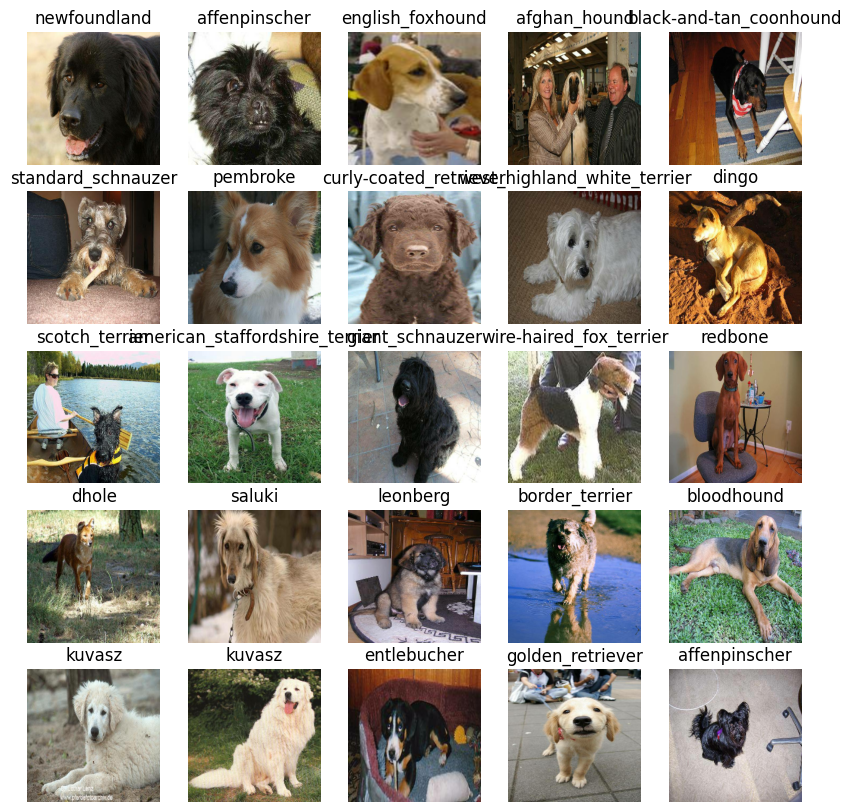

In [33]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

# Building a model
Before we build a model, there are a few things we need to define:

- The input shape (our images shape, in the form of Tensors) to our model.
- The output shape (image labels, in the form of Tensors) of our model.
- The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [34]:
# Setup input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setup output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setup model url from tensorflowhub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

# Put data into Keras DL model
Create a function which:

- Takes the input shape, output shape and the model we've chosen as parameters.
- Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
- Compiles the model (says it should be evaluated and improved).
- Builds the model (tells the model the input shape it'll be getting).
- Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [10]:
# Function to build a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", model_url)

    # Setup the model layers
    model = tf.keras.Sequential([
        hub.KerasLayer(model_url), # layer 1 (input layer)
        tf.keras.layers.Dense(units=output_shape, activation='softmax') # layer 2 (output layer)
    ])

    # Compile the model
    model.compile(
        loss = tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=['accuracy']
    )

    # Build the model
    model.build(input_shape)

    return model

NameError: ignored

In [36]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension
1. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
1. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [37]:
# Load TensorBoard extension
%load_ext tensorboard

In [11]:
import datetime

# Function to build a TensorBoard callback
def create_tensorboard_callback():
    # Store TensorBoard logs
    logdir = os.path.join(
        "/content/drive/MyDrive/AI/Deep Learning: \"Learning\"/dog-breed-classification/logs",
        datetime.datetime.now().strftime('%Y-%m-%d - %H:%M:%S')
    )

    return tf.keras.callbacks.TensorBoard(logdir)

# Early stopping callback

In [39]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

# Train model on subset

In [40]:
NUM_EPOCHS = 100 # @param {type:"slider", min:10, max:100, step:10}

In [41]:
# Function to train model
def train_model():
    model = create_model()

    # Create new TensorBoard session
    tensorboard = create_tensorboard_callback()

    model.fit(
        x=train_data,
        epochs=NUM_EPOCHS,
        validation_data=val_data,
        validation_freq=1,
        callbacks=[tensorboard, early_stopping],
    )

    return model

In [42]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 179s 7s/step - loss: 4.5409 - accuracy: 0.0988 - val_loss: 3.4245 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 2s 94ms/step - loss: 1.6098 - accuracy: 0.7063 - val_loss: 2.1663 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 3s 101ms/step - loss: 0.5715 - accuracy: 0.9287 - val_loss: 1.6780 - val_accuracy: 0.6150
Epoch 4/100
25/25 [==============================] - 3s 119ms/step - loss: 0.2549 - accuracy: 0.9875 - val_loss: 1.5036 - val_accuracy: 0.6450
Epoch 5/100
25/25 [==============================] - 2s 97ms/step - loss: 0.1488 - accuracy: 0.9962 - val_loss: 1.4191 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 2s 97ms/step - loss: 0.0999 - accuracy: 1.0000 - val_loss: 1.3710 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================] - 

# Checking the TensorBoard logs
The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [43]:
%tensorboard --logdir /content/drive/MyDrive/AI/Deep\ Learning:\ \"Learning\"/dog-breed-classification/logs

<IPython.core.display.Javascript object>

# Make predictions

In [44]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 80ms/step


array([[1.7097405e-04, 3.2421107e-05, 3.3963085e-04, ..., 9.3686458e-04,
        2.3279870e-05, 4.6743718e-03],
       [1.7318490e-03, 1.9465278e-04, 3.3481080e-02, ..., 3.2610394e-04,
        2.3548610e-03, 2.6105487e-05],
       [8.9809046e-06, 8.0303529e-05, 3.5942845e-05, ..., 6.7951987e-05,
        2.1044201e-05, 1.3081373e-04],
       ...,
       [3.9956035e-06, 9.8307073e-06, 1.6446428e-04, ..., 7.1662748e-06,
        7.6321528e-05, 6.5864966e-05],
       [2.7430581e-03, 2.6577403e-04, 2.9688083e-05, ..., 9.4541640e-05,
        4.5400138e-05, 7.5456011e-03],
       [1.5993764e-04, 5.4059274e-06, 5.9584327e-05, ..., 1.2613551e-03,
        1.4321455e-03, 1.3736570e-05]], dtype=float32)

In [45]:
predictions.shape

(200, 120)

In [46]:
# First prediction
index = 50
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[8.61188746e-04 8.30052522e-06 7.77206151e-06 3.98138800e-05
 1.87865734e-01 1.08015716e-04 1.03639677e-05 4.26514214e-03
 1.02122314e-04 3.06212423e-05 1.11510581e-05 9.84362487e-05
 1.62658820e-04 3.00402571e-05 5.93685254e-05 5.26143776e-06
 1.16472959e-03 1.21695193e-04 2.45066531e-06 8.84838682e-03
 6.93934780e-05 1.94372507e-04 1.52767534e-04 7.30028769e-05
 5.72330027e-05 2.64199288e-03 2.10766317e-04 7.80258095e-04
 4.86634759e-04 1.84677992e-04 2.75898579e-04 3.59447731e-05
 8.80281295e-05 7.97442277e-04 3.49747104e-04 3.25660949e-05
 1.98404930e-04 1.27463354e-04 2.22450821e-04 5.59994114e-05
 5.40618959e-04 1.86850448e-04 1.42522866e-03 7.90252758e-04
 1.39696593e-03 4.97799600e-04 1.67131311e-05 5.36869629e-04
 5.70171578e-05 8.74582111e-05 1.92620100e-05 2.89593881e-04
 3.84961459e-04 1.28478132e-04 3.68276698e-04 9.70116525e-05
 9.15215514e-06 4.74064836e-05 1.26729696e-03 5.03145611e-06
 7.15050337e-05 7.89404567e-06 1.46855440e-04 5.36020380e-04
 9.41372782e-05 3.097745

In [47]:
# Function to turn prediction probabilities to label
def get_pred_label(prediction_probabilities):
    return unique_breeds[np.argmax(prediction_probabilities)]

In [48]:
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [49]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

# Unbatch the dataset

In [12]:
# Function to unbatchify
def unbatchify(dataset):
    images_ = []
    labels_ = []

    for image, label in dataset.unbatch().as_numpy_iterator():
        images_.append(image)
        labels_.append(unique_breeds[np.argmax(label)])

    return images_, labels_

In [51]:
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [52]:
# Visualize
def plot_pred(predictions, labels, images, n=1):
    pred_prob, true_label, image = predictions[n], labels[n], images[n]
    # Get predicted label
    pred_label = get_pred_label(pred_prob)

    if pred_label == true_label:
        color = 'green'
    else:
        color = 'red'

    # Plot
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.title(f'{pred_label} {round(np.max(pred_prob)*100, 2)}% {true_label}', color=color)

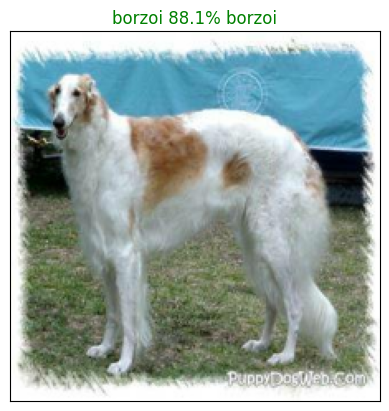

In [53]:
plot_pred(predictions, val_labels, val_images, 108)

In [54]:
# Function to visualize top 10 predictions
def plot_pred_conf(predictions, labels, n=1):
    pred_prob, true_label = predictions[n], labels[n]

    # Get predicted label
    pred_label = get_pred_label(pred_prob)

    # Find top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

    # Find top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    # Find top 10 prediction confidence labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    top_plot = plt.bar(np.arange(10), top_10_pred_values, color='grey')
    plt.xticks(np.arange(10), labels=top_10_pred_labels, rotation='vertical')

    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
        pass

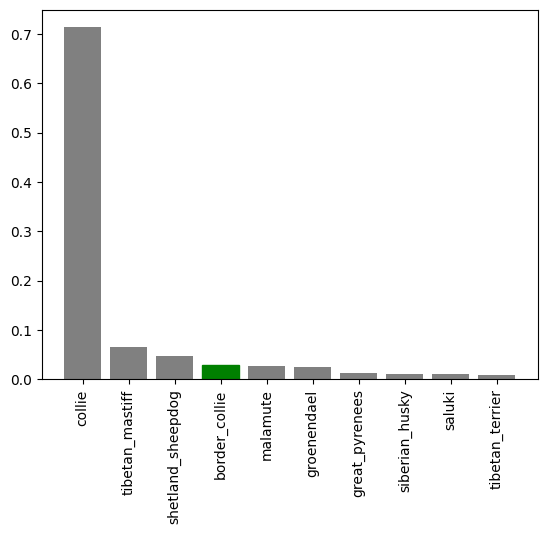

In [55]:
plot_pred_conf(predictions, val_labels, n=9)

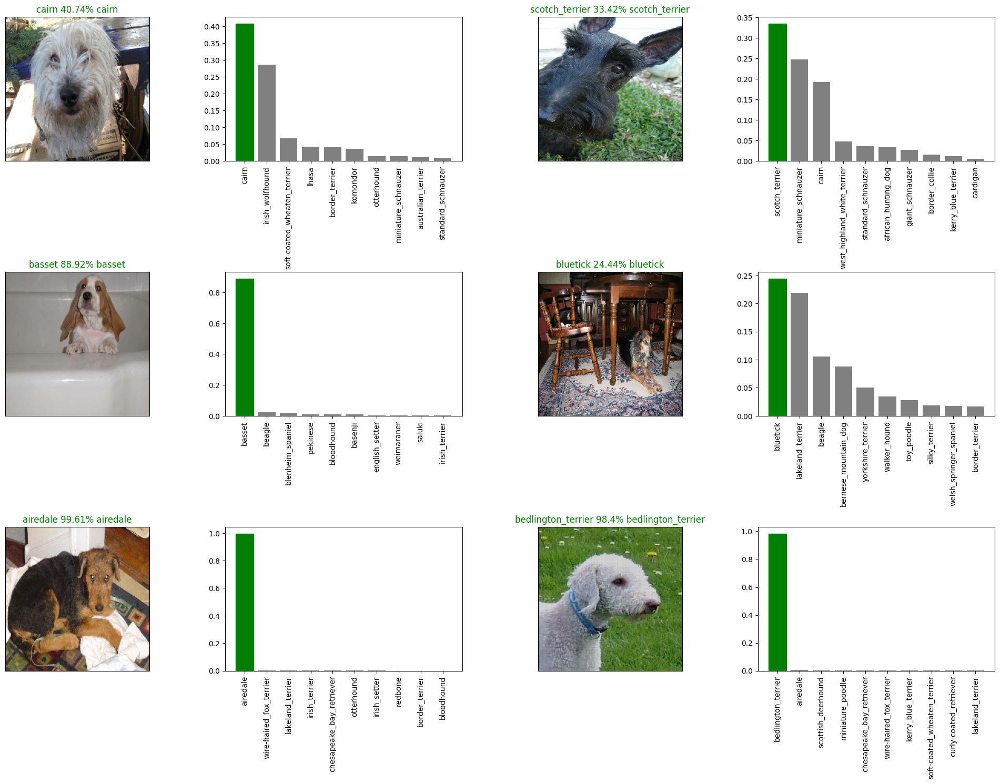

In [56]:
# Checkout some predictions with their confidences
i_multiplier = 0
rows = 3
cols = 2
images = rows*cols
plt.figure(figsize=(10*cols, 5*rows))

for i in range(images):
    plt.subplot(rows, 2*cols, 2*i+1)
    plot_pred(predictions, val_labels, val_images, n=i+i_multiplier)

    plt.subplot(rows, 2*cols, 2*i+2)
    plot_pred_conf(predictions, val_labels, n=i+i_multiplier)

plt.tight_layout(h_pad=.4)
plt.show()

# Save the model

In [57]:
# Function to save the model
def save_model(model, suffix=None):
    # Create a model directory pathname with current time
    modeldir = os.path.join("/content/drive/MyDrive/AI/Deep Learning: \"Learning\"/dog-breed-classification/models", datetime.datetime.now().strftime('%Y-%m-%d - %H:%M:%S'))
    model_path = modeldir + "-" + suffix + ".keras"
    print(f"Saving model to: {model_path} ...")
    model.save(model_path)
    return model_path

In [2]:
# Function to load a model
def load_model(model_path):
    print(f"Loading saved models from: {model_path}")
    model = tf.keras.models.load_model(model_path, custom_objects={'KerasLayer': hub.KerasLayer})
    return model

In [ ]:
# Save our model
saved_model_path = save_model(model, suffix='1000-images-mobilenetv2-Adam')
saved_model_path

In [60]:
loaded_1000_image_model = load_model('/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/models/2023-12-25 - 18:04:05-1000-images-mobilenetv2-Adam.keras')

Loading saved models from: /content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/models/2023-12-25 - 18:04:05-1000-images-mobilenetv2-Adam.keras


In [61]:
# Evluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 73ms/step - loss: 1.2073 - accuracy: 0.7000


[1.2072796821594238, 0.699999988079071]

In [62]:
# Evluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 69ms/step - loss: 1.3136 - accuracy: 0.6400


[1.3136353492736816, 0.6399999856948853]

# Training a model on full data

In [63]:
len(X), len(y)

(10222, 10222)

In [64]:
X[:10]

['/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/conte

In [65]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [66]:
# Create data batch of full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [67]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [68]:
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [69]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

In [70]:
full_model.fit(
    x=full_data,
    epochs=NUM_EPOCHS,
    callbacks=[full_model_tensorboard, full_model_early_stopping]
)

Epoch 1/100
320/320 [==============================] - 34s 90ms/step - loss: 1.3258 - accuracy: 0.6731
Epoch 2/100
320/320 [==============================] - 29s 90ms/step - loss: 0.3998 - accuracy: 0.8806
Epoch 3/100
320/320 [==============================] - 31s 95ms/step - loss: 0.2359 - accuracy: 0.9369
Epoch 4/100
320/320 [==============================] - 30s 92ms/step - loss: 0.1528 - accuracy: 0.9635
Epoch 5/100
320/320 [==============================] - 28s 88ms/step - loss: 0.1066 - accuracy: 0.9779
Epoch 6/100
320/320 [==============================] - 29s 91ms/step - loss: 0.0756 - accuracy: 0.9875
Epoch 7/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0604 - accuracy: 0.9896
Epoch 8/100
320/320 [==============================] - 28s 89ms/step - loss: 0.0460 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 28s 87ms/step - loss: 0.0366 - accuracy: 0.9963
Epoch 10/100
320/320 [==============================] - 27s 84ms/step - l

In [71]:
full_images_model_path = save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')
full_images_model_path

Saving model to: /content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/models/2023-12-26 - 08:28:30-full-image-set-mobilenetv2-Adam.keras ...


'/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/models/2023-12-26 - 08:28:30-full-image-set-mobilenetv2-Adam.keras'

In [14]:
loaded_full_model = load_model('/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/models/2023-12-26 - 08:28:30-full-image-set-mobilenetv2-Adam.keras')

Loading saved models from: /content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/models/2023-12-26 - 08:28:30-full-image-set-mobilenetv2-Adam.keras


# Make predictions on test data

### Tranform test_data

In [22]:
# Load test image filenames
test_path = '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [23]:
test_filenames[:10]

['/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/test/e1cfddc1d5315f1dba011c6152822786.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/test/e9574ebd4785c1e1a1470dfc93f9271e.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/test/e87771bc542cc6112c922962d8fda92b.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/test/e4a8dfc6e219b20a0cbced41eaf6a435.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/test/ddbdd621e79563a56443a0dd1ee4c48d.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/test/e1dd78810048dc387573f2ec50e4bb16.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/test/dd5c5652d5d34e922af98c9b0295d909.jpg',
 '/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/test/e061b8d24e7b1324a6ac92ae81fdda19.jpg',
 '/content/drive

In [24]:
len(test_filenames)

10357

In [25]:
test_data = create_data_batches(X=test_filenames, test_data=True)

Creating test data batches...


In [26]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [27]:
# make predictions
test_preds = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 158s 466ms/step


In [29]:
test_preds[:10]

array([[1.47746793e-09, 3.05570537e-13, 2.72226264e-09, ...,
        1.01450914e-05, 9.90253574e-11, 3.96116140e-10],
       [4.62216491e-07, 5.05393245e-06, 3.50324303e-09, ...,
        1.44992836e-08, 1.28385588e-03, 2.51453287e-07],
       [6.91749156e-03, 3.50008492e-07, 2.47439544e-07, ...,
        2.04953994e-06, 6.35466901e-10, 2.00724526e-06],
       ...,
       [1.75767878e-09, 1.76791097e-08, 5.16336947e-08, ...,
        2.96566438e-10, 2.04090895e-08, 3.56381191e-09],
       [8.86662406e-07, 2.79466832e-08, 2.51330130e-06, ...,
        1.42185286e-06, 5.38213586e-04, 1.12571352e-05],
       [2.26645203e-10, 4.79487001e-13, 1.09537865e-10, ...,
        1.54952648e-10, 6.78220050e-11, 2.28191892e-11]], dtype=float32)

In [30]:
test_preds.shape

(10357, 120)

# Prepare predictions for kaggle

In [44]:
test_ids = [os.path.splitext(f)[0] for f in os.listdir(test_path)]
test_ids[:2]

['e1cfddc1d5315f1dba011c6152822786', 'e9574ebd4785c1e1a1470dfc93f9271e']

In [45]:
# Create a pandas dataframe
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [46]:
preds_df['id'] = test_ids

In [47]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1cfddc1d5315f1dba011c6152822786,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e9574ebd4785c1e1a1470dfc93f9271e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e87771bc542cc6112c922962d8fda92b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e4a8dfc6e219b20a0cbced41eaf6a435,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ddbdd621e79563a56443a0dd1ee4c48d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
len(preds_df)

10357

In [49]:
# Add values
preds_df[list(unique_breeds)] = test_preds
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1cfddc1d5315f1dba011c6152822786,1.477468e-09,3.055705e-13,2.722263e-09,7.651148e-12,2.872370e-10,1.405182e-12,6.564583e-10,4.201375e-09,3.921191e-11,...,1.738113e-06,1.653674e-06,5.017700e-11,4.926208e-11,5.583448e-10,1.502162e-11,2.617136e-09,1.014509e-05,9.902536e-11,3.961161e-10
1,e9574ebd4785c1e1a1470dfc93f9271e,4.622165e-07,5.053932e-06,3.503243e-09,1.726134e-08,2.260978e-07,1.336750e-09,5.968166e-10,4.241468e-07,9.994555e-09,...,4.815454e-03,7.583839e-07,2.013629e-08,7.723933e-08,2.774328e-06,2.741636e-07,7.508377e-04,1.449928e-08,1.283856e-03,2.514533e-07
2,e87771bc542cc6112c922962d8fda92b,6.917492e-03,3.500085e-07,2.474395e-07,2.532016e-07,1.041570e-11,2.772754e-09,4.077295e-10,1.812695e-09,4.010359e-12,...,3.583487e-07,8.317951e-10,2.269672e-10,1.679908e-08,3.024705e-10,5.973611e-10,3.349097e-10,2.049540e-06,6.354669e-10,2.007245e-06
3,e4a8dfc6e219b20a0cbced41eaf6a435,1.249224e-09,3.041708e-08,6.087267e-10,7.373178e-06,6.984073e-08,5.083021e-05,2.600626e-05,2.145451e-04,2.658869e-04,...,4.890921e-06,7.349645e-06,2.046641e-06,3.117408e-01,5.251893e-08,1.380657e-08,9.035972e-09,5.489717e-07,1.878318e-05,7.334681e-10
4,ddbdd621e79563a56443a0dd1ee4c48d,4.979224e-07,7.483124e-09,4.459012e-09,2.372649e-07,2.503570e-09,1.277943e-07,2.696546e-07,8.279018e-09,5.557422e-09,...,2.369679e-07,1.689354e-09,1.204462e-08,5.756487e-08,5.810767e-06,1.201157e-10,2.099726e-09,1.229651e-09,7.712833e-09,9.425793e-11


In [50]:
preds_df.to_csv('/content/drive/MyDrive/AI/Deep Learning: "Learning"/dog-breed-classification/full_model_predictions_mobilenetV2.csv',
                index=False)